




# Projet Fil Rouge 2025 : Reconnaissance de commandes audio


**Noms :**

**Prénoms :**

**Nom du binôme :**




Ces 12 séances de TP vont vous permettre de tester l'algorithme de programmation dynamique vu en CTD puis de réaliser la mise en oeuvre d'un système de reconnaissance audio de mots isolés (constituant des
commandes pour les drones).

<img src="files/DroneJS.JPG" width="600" height="500"  >



Ces séances se décomposent en ces parties : 
- Partie I : Prétraitement des données 
- Partie II : Sélection de variables et pénalisation
- Partie III : Classification par méthodes à noyau 
- Partie IV : Apprentissage par ensemble : Adaboost, gradient boosting
- Partie V : Classification par réseaux de neurones
- Partie VI : Votre étude




In [71]:
import matplotlib.pyplot as plt
import numpy as np
import scipy
import sklearn
import math
import numpy.random as rnd
import seaborn as sns
import librosa
from os import listdir
from os.path import isfile, join
import glob
import re



# Preprocessing

Sur l'espace moodle, vous trouverez un dossier d'enregistrements audio de mots de commandes pour un drone quadricoptère constitués de plusieurs locuteurs masculins (notés M01..M13) et locutrice féminines (F01..F05) pour quelques commandes. 


In [72]:
data = [] 
label = [] 
genres = []
min_duration = None
words = ['avance','recule','tournegauche']
list_genres = ['M', 'F']

for file_name in glob.glob('FichierTest/*.wav'):
    record = librosa.load(file_name)[0]
    data.append(record)
    # Computation of the minimal size of recordings
    if min_duration is None or record.shape[0] < min_duration:
        min_duration = record.shape[0] 
    
    # Creation of the vector of label
    for i, word in enumerate(words):
      if re.search(word, file_name):
        label.append(i)

    # Creation of the vector of label
    for i, genre in enumerate(list_genres):
      if re.search(genre, file_name[12:]):# 12 is for ignoring "FichierTest/"
        genres.append(genre)

fs = librosa.load(file_name)[1] # Sampling frequency
genres = np.array(genres)
print(f'The smallest record contains {min_duration} samples, and the sample frequency is {fs} Hz')


The smallest record contains 18522 samples, and the sample frequency is 22050 Hz


### We trim the recordings to isolate the word and have identical durations
The smallest record contains 18 522 samples. We are going to cut all recordings to be of this size.

In [73]:

def trim(record):
    half_duration = 18522//2

    # First, we compute the barycenter of energy along time. We interpret it as the moment when the word appears
    barycenter = int(np.floor(np.multiply(np.power(record,2),np.arange(0,record.shape[0],1)).sum()/np.power(record,2).sum()))

    # Second, we adjust the barycenter to be in the index range
    if barycenter-half_duration < 0:
        barycenter += half_duration-barycenter
    if barycenter+half_duration >= record.shape[0]:
        barycenter -= barycenter+half_duration - record.shape[0]
    
    # Finally, we trim the recording around the barycenter 
    return record[barycenter-half_duration:barycenter+half_duration]

In [74]:
X = np.empty((len(data),min_duration))
for i in range(len(data)):
    X[i,:] = trim(data[i])

y = np.array(label)
print(f'Shape of inputs X is{X.shape} and size of targets class is {y.shape}')

Shape of inputs X is(54, 18522) and size of targets class is (54,)


### Spectral representation

1. Apply a Fourier transform on the signals in $X$ using the function fft of scipy. Explain why the resulting dimension is too large to apply logistic regression.

2. Let $\hat{X}$ be the Fourier transform of $X$. Apply a PCA on $|\hat{X}|$ and plot the total explained variance in function of the numer of components.

In [75]:
from scipy import signal
from scipy.fft import fft, fftshift, fftfreq

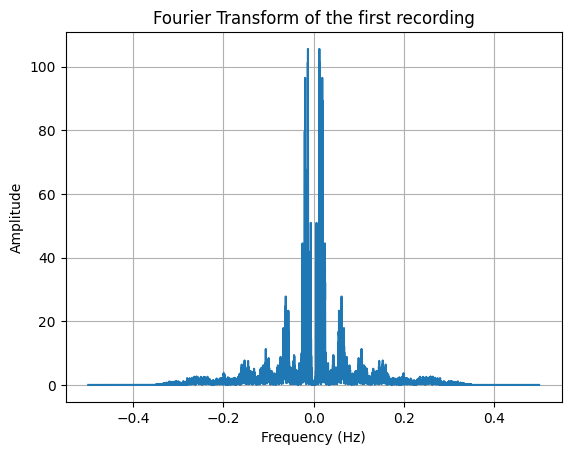

In [76]:
n, p = X.shape
TF_X = fftshift(fft(X, axis=1), axes=1)
mod_TF_X = np.abs(TF_X)

mod_TF_X0 = mod_TF_X[0,:]
frequences = fftshift(fftfreq(p))

plt.plot(frequences, mod_TF_X0)
plt.title('Fourier Transform of the first recording')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Amplitude')
plt.grid()
plt.show()

Rq: on peut garder que la moitié du signal (symétrie par rapport à zéro). Si on veut faire une regression logistique il faudra faire une pca sinon on aura plus de variables que de donnée.

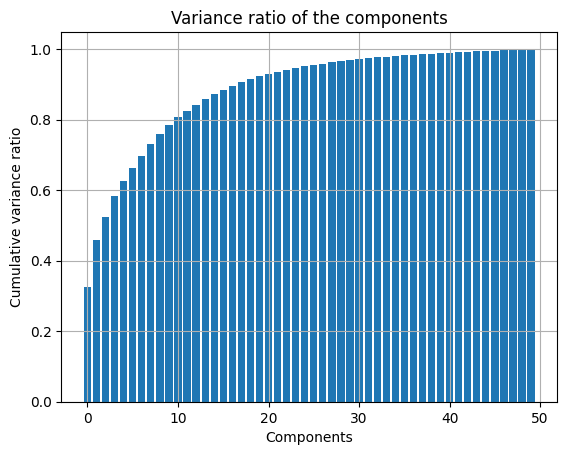

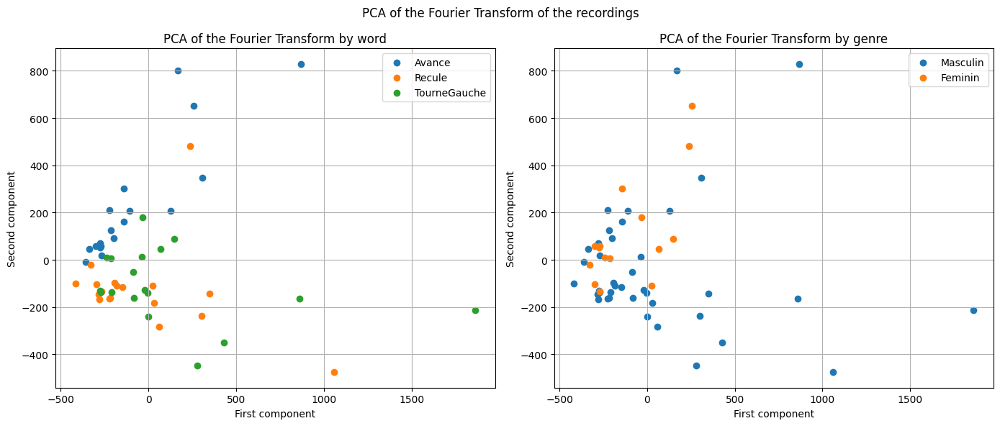

In [77]:
from sklearn.decomposition import PCA

TF_X_half = TF_X[:, p//2]
mod_TF_X_half = np.abs(TF_X_half)

nb_components = 50
ACP = PCA(nb_components)
ACP_mod_TF_X = ACP.fit_transform(mod_TF_X)

expl_var = ACP.explained_variance_
expl_var_ratio = ACP.explained_variance_ratio_

components = range(nb_components)
cum_expl_var_ratio = np.cumsum(expl_var_ratio)

plt.bar(components, cum_expl_var_ratio)
plt.title('Variance ratio of the components')
plt.xlabel("Components")
plt.ylabel("Cumulative variance ratio")
plt.grid()
plt.show()



fig, axs = plt.subplots(1, 2, figsize=(14, 6))
plt.suptitle('PCA of the Fourier Transform of the recordings')

order_by_label = [[], [], []]
for i, l in enumerate(label):
    order_by_label[l].append(ACP_mod_TF_X[i, :])
order_by_label = [np.array(indivs) for indivs in order_by_label]

axs[0].scatter(order_by_label[0][:, 0], order_by_label[0][:, 1], label="Avance")
axs[0].scatter(order_by_label[1][:, 0], order_by_label[1][:, 1], label="Recule")
axs[0].scatter(order_by_label[2][:, 0], order_by_label[2][:, 1], label="TourneGauche")
axs[0].set_title('PCA of the Fourier Transform by word')
axs[0].set_xlabel("First component")
axs[0].set_ylabel("Second component")
axs[0].legend()
axs[0].grid()

order_by_genre = [[], []]
genre_labels = ["M", "F"]
for i, l in enumerate(genres):
    order_by_genre[genre_labels.index(l)].append(ACP_mod_TF_X[i, :])
order_by_genre = [np.array(indivs) for indivs in order_by_genre]

axs[1].scatter(order_by_genre[0][:, 0], order_by_genre[0][:, 1], label="Masculin")
axs[1].scatter(order_by_genre[1][:, 0], order_by_genre[1][:, 1], label="Feminin")
axs[1].set_title('PCA of the Fourier Transform by genre')
axs[1].set_xlabel("First component")
axs[1].set_ylabel("Second component")
axs[1].legend()
axs[1].grid()

plt.tight_layout()
plt.show()

3. Apply a Short Term Fourier Transform on $X$. What are the dimension of stft $\hat{X}[t,f]$?

4. Make 2 subplots (3x3) of the stft (as images with function .imshow()) with three instances of each words, one for male and one for female 

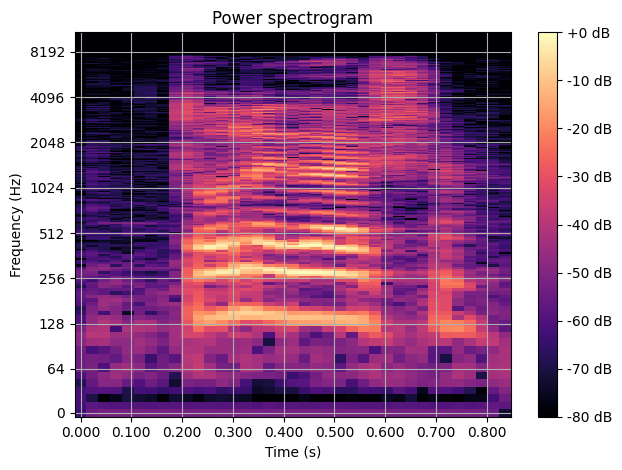

In [78]:
from scipy.signal import stft

STFT_X = librosa.stft(X)
mod_STFT_X = np.abs(STFT_X)
mod_STFT_X0 = mod_STFT_X[0, :, :]
db_STFT_X0 = librosa.amplitude_to_db(mod_STFT_X0, ref=np.max)

fig, ax = plt.subplots()
img = librosa.display.specshow(db_STFT_X0, y_axis='log', x_axis='time', ax=ax)
ax.set_title('Power spectrogram')
fig.colorbar(img, ax=ax, format="%+2.0f dB")
plt.xlabel('Time (s)')
plt.ylabel('Frequency (Hz)')
plt.grid()
plt.tight_layout()
plt.show()

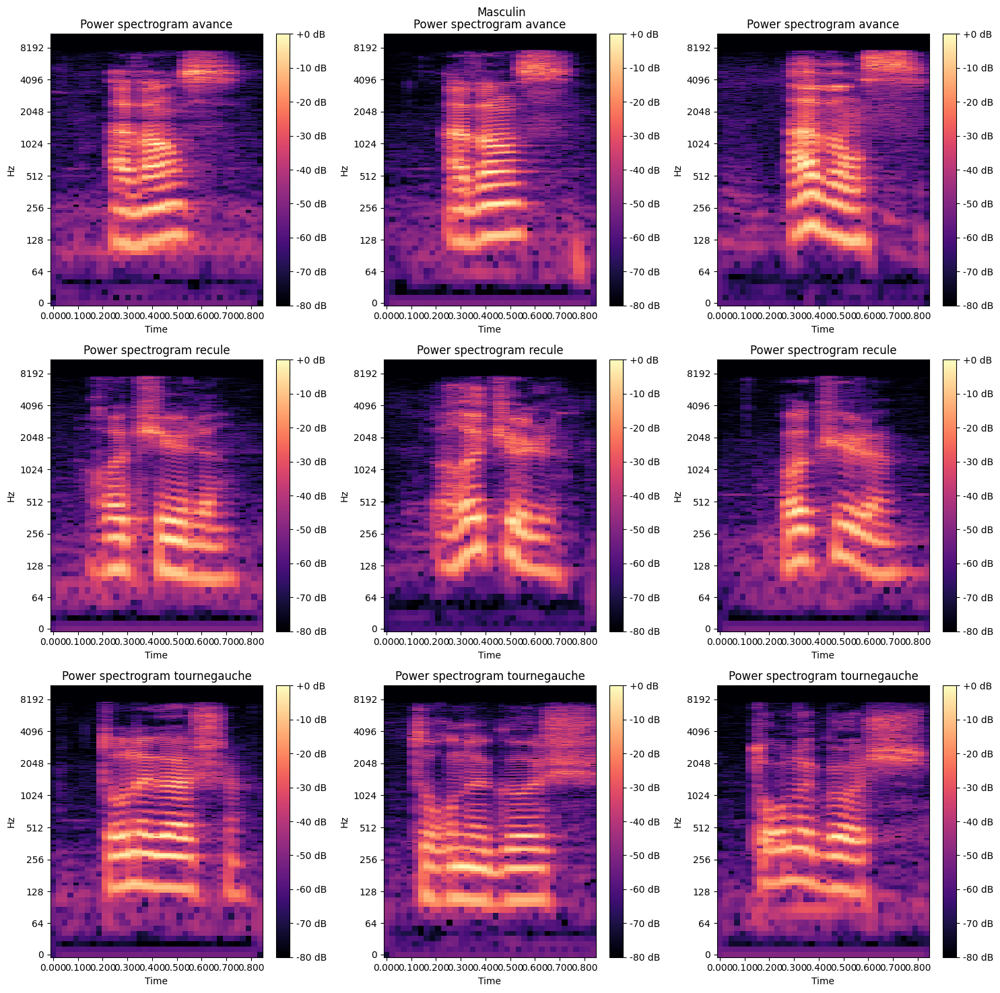

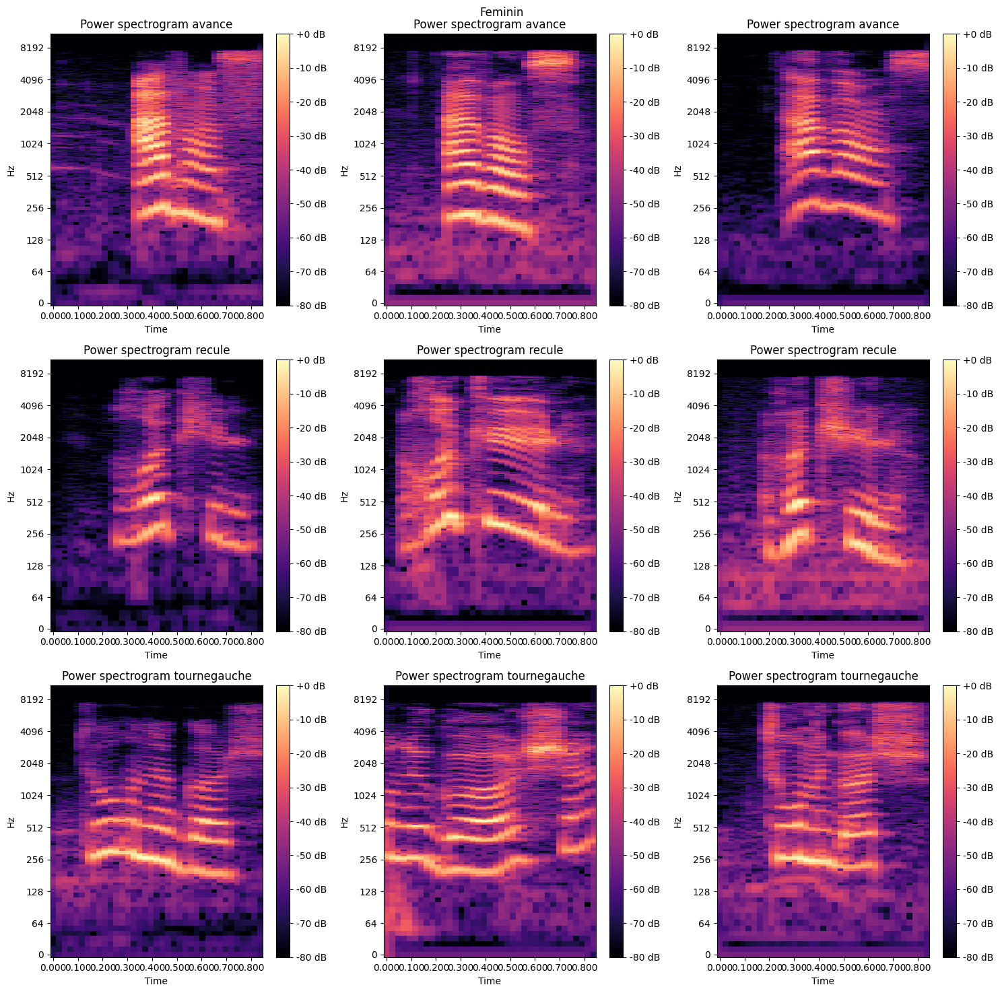

In [79]:
def show_subplot(indivs, labels, name):
    fig, axes = plt.subplots(3, 3, figsize=(15, 15))
    for mot in range(3):
        indiv_mot = indivs[labels == mot]
        for i, indiv in enumerate(indiv_mot[:3, :]):
            S = librosa.stft(indiv)
            mod_S = np.abs(S)
            db_S = librosa.amplitude_to_db(mod_S, ref=np.max)
            img = librosa.display.specshow(db_S, y_axis='log', x_axis='time', ax=axes[mot, i])
            axes[mot, i].set_title(f'Power spectrogram {words[mot]}')
            #axes.imshow(img)
            fig.colorbar(img, ax=axes[mot, i], format="%+2.0f dB")
    fig.suptitle(f"{name}")
    plt.tight_layout()
    plt.show()

mask_men = genres == "M"
men = X[mask_men, :]
label_men = np.array(label)[mask_men]
show_subplot(men, label_men, "Masculin")

mask_women = genres == "F"
women = X[mask_women, :]
label_women = np.array(label)[mask_women]
show_subplot(women, label_women, "Feminin")

### MFCC (Mel-Frequency Cepstral Coefficients)

1. Compute the MFCC of the signals in $X$ using the librosa library.

2. As for Short Term Fourier Transform, plot the computed coefficients over time of three instances of each word, one male and one for female 

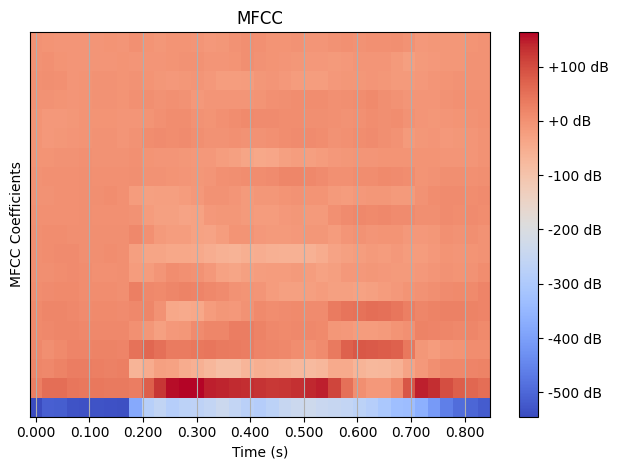

In [80]:
MFCC_X = librosa.feature.mfcc(y=X, sr=fs)
MFCC_X0 = MFCC_X[0, :, :]

fig, ax = plt.subplots()
img = librosa.display.specshow(MFCC_X0, x_axis='time', ax=ax)
ax.set_title('MFCC')
fig.colorbar(img, ax=ax, format="%+2.0f dB")
plt.xlabel('Time (s)')
plt.ylabel('MFCC Coefficients')
plt.grid()
plt.tight_layout()
plt.show()

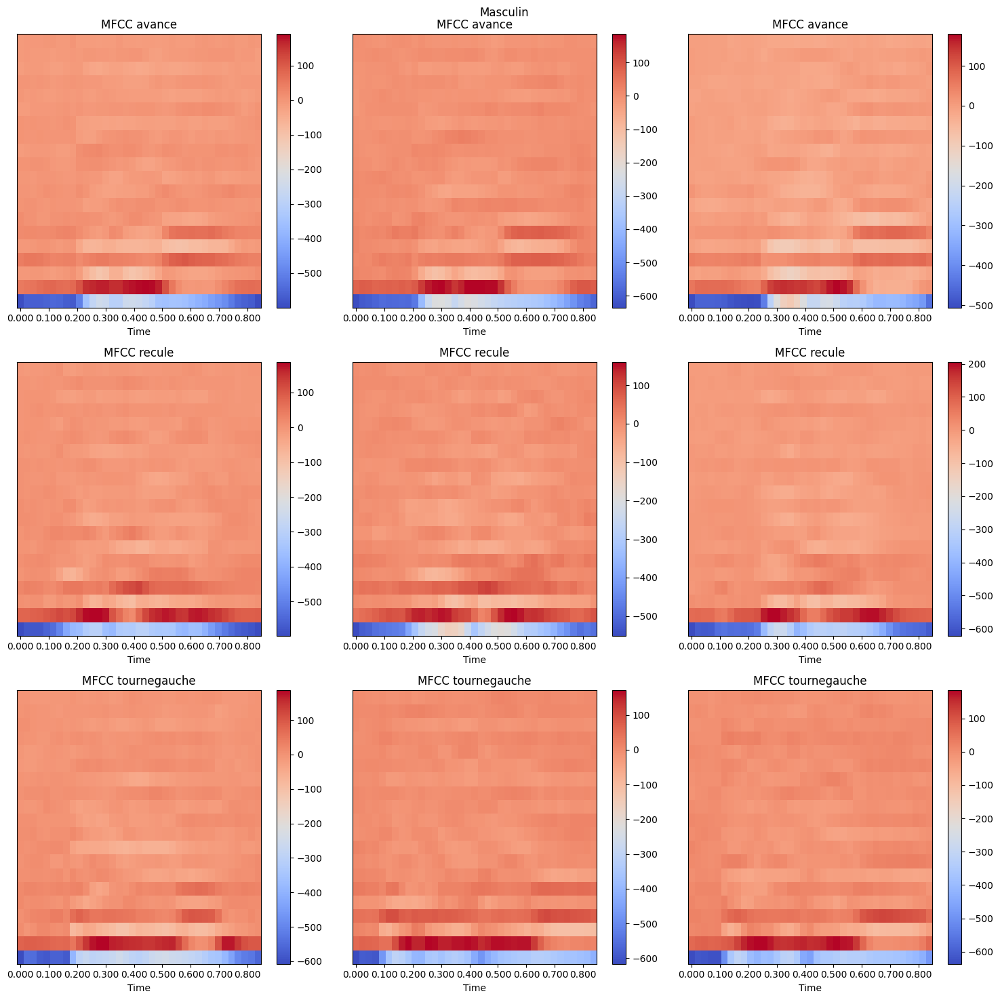

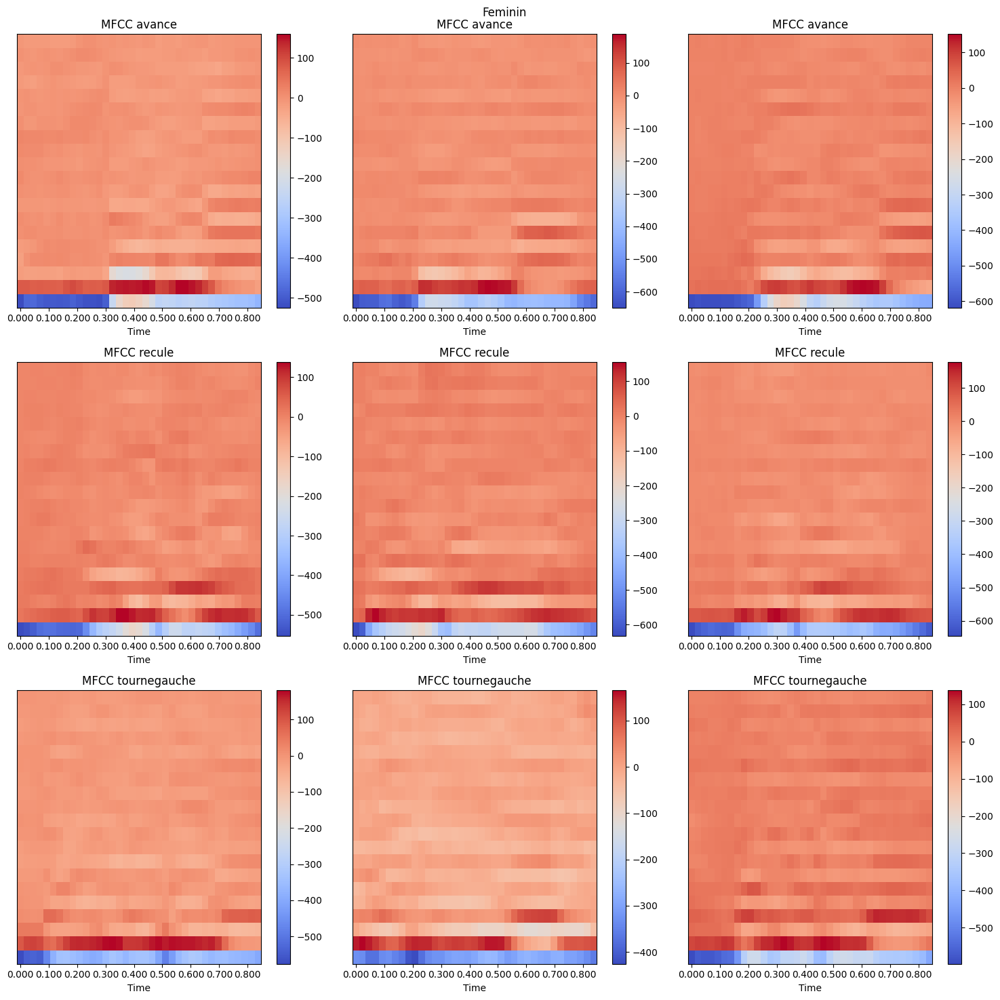

In [81]:
def show_subplot(indivs, labels, name):
    fig, axes = plt.subplots(3, 3, figsize=(15, 15))
    for mot in range(3):
        indiv_mot = indivs[labels == mot]
        for i, indiv in enumerate(indiv_mot[:3, :]):
            mfcc = librosa.feature.mfcc(y=indiv, sr=fs)
            img = librosa.display.specshow(mfcc, x_axis='time', ax=axes[mot, i])
            axes[mot, i].set_title(f'MFCC {words[mot]}')
            fig.colorbar(img, ax=axes[mot, i])
    fig.suptitle(f"{name}")
    plt.tight_layout()
    plt.show()

mask_men = genres == "M"
men = X[mask_men, :]
label_men = np.array(label)[mask_men]
show_subplot(men, label_men, "Masculin")

mask_women = genres == "F"
women = X[mask_women, :]
label_women = np.array(label)[mask_women]
show_subplot(women, label_women, "Feminin")

# On peut jouer sur le nombre de composantes

#### Now we will build sklearn transformers to extract features

Create a class STFT in the same spirit as FFT. 
Add a first argument to choose between returning different statistics (mean, quantile, max...) along time. Add a second argument that gives the maximum frequency index  
   
Likewise, create a class MFCC as just before, define a first agument to choose between returning different statistics (mean, quantile, max...) along time and another one to select the number of coefficients.

In [82]:
from sklearn.base import BaseEstimator, TransformerMixin

In [83]:
class FFT(BaseEstimator, TransformerMixin):
    def __init__(self, idx_frequence_max=None):
        self.idx_frequence_max = idx_frequence_max
    def fit(self, X, y=None):
        return self
    def transform(self, X, y=None):
        # Perform arbitary transformation        
        return np.absolute(fft(X)[:self.idx_frequence_max])
    def __repere__(self):
        print("FFT")

In [84]:
def my_max(array):
    return np.max(array, axis=-1)

def my_min(array):
    return np.min(array, axis=-1)

def my_mean(array):
    return np.mean(array, axis=-1)

def my_median(array):
    return np.median(array, axis=-1)

def my_std(array):
    return np.std(array, axis=-1)

def med_std(array):
    std = np.std(array, axis=-1)
    med = np.median(array, axis=-1)
    return np.concatenate([std, med], axis=-1)

def min_max(array):
    min = np.min(array, axis=-1)
    max = np.max(array, axis=-1)
    return np.concatenate([min, max], axis=-1)

In [85]:
class STFT(BaseEstimator, TransformerMixin):
    
    def __init__(self, time_statistics, idx_frequence_max):
        self.idx_frequence_max = idx_frequence_max
        self.time_statistics = time_statistics
    
    def fit(self, X, y=None):
        return self

    def transform(self, X):
        STFT_X = librosa.stft(X)
        mod_STFT_X = np.abs(STFT_X)
        fmax_mod_STFT_X = mod_STFT_X[:, :self.idx_frequence_max, :]
        time_stat = self.time_statistics(fmax_mod_STFT_X)
        return time_stat

    def __repere__(self):
        print("STFT")

In [86]:
class MFCC(BaseEstimator, TransformerMixin):
    
    def __init__(self, time_statistics, n_mfcc):
        self.time_statistics = time_statistics
        self.n_mfcc = n_mfcc
    
    def fit(self, X, y=None):
        return self

    def transform(self, X):
        MFCC_X = librosa.feature.mfcc(y=X, sr=fs, n_mfcc=self.n_mfcc)
        time_stat = self.time_statistics(MFCC_X)
        return time_stat
    
    def __repere__(self):
        print("MFCC")

# Partie I : Multiclass regression


Apply a **multiclass regression** model.

We model the probabilities by the following form :

$$
\mathbb{P}(Y_i = j) = \frac { \exp^{-\beta_j^{T} X_i } } {1 + \sum_{\ell = 1}^{K-1} \exp^{-\beta_\ell^{T} X_i }}, 
$$
For all $j$ in $\{ 1,2, \dots , K-1 \}$.





In [87]:
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import GridSearchCV
from sklearn.pipeline import Pipeline

from sklearn.metrics import accuracy_score
import warnings

First without using Pipeline from sklearn.pipeline, perform a leave one out cross validation by hand with a logistic regression classifier **LogisticRegression** after preprocessing the data (choose one preprocessing technique aforementionnned).

In [88]:
warnings.filterwarnings("ignore", category=UserWarning)
warnings.filterwarnings("ignore", category=FutureWarning)
warnings.filterwarnings("ignore", category=RuntimeWarning)
warnings.filterwarnings("ignore", category=DeprecationWarning)
warnings.filterwarnings("ignore", category=SyntaxWarning)
warnings.filterwarnings("ignore", category=ImportWarning)
warnings.filterwarnings("ignore", category=PendingDeprecationWarning)
warnings.filterwarnings("ignore", category=ResourceWarning)
warnings.filterwarnings("ignore", category=Warning)

def leave_one_out(X, preprocessor, y, penalty="l2", C=1, max_iter=1000):

    preprocessor.fit(X)
    preprocessed_X = preprocessor.transform(X)

    scaler = StandardScaler()
    scaled_preprocessed_X = scaler.fit_transform(preprocessed_X)

    regression = LogisticRegression(penalty=penalty, C=C, solver="saga", max_iter=max_iter)
    predictions = []
    n , p = scaled_preprocessed_X.shape

    for i in range(n):
        
        y_train = np.delete(y, i, axis=0)
        y_test = [y[i]]

        scaled_preprocessed_X_train = np.delete(scaled_preprocessed_X, i, axis=0)
        scaled_preprocessed_X_test = [scaled_preprocessed_X[i, :]]

        model = regression.fit(scaled_preprocessed_X_train, y_train)
        prediction = model.predict(scaled_preprocessed_X_test)
        predictions.extend(prediction)

    return accuracy_score(y, predictions)

#preprocessor_FFT = FFT(40)
#print(leave_one_out(X, preprocessor_FFT, y))

#preprocessor_STFT = STFT(med_std, 460)
#print(leave_one_out(X, preprocessor_STFT, y, "l2", 0.1))

preprocessor_MFCC = MFCC(med_std, 10)
print(leave_one_out(X, preprocessor_MFCC, y, "l1", 10))

#preprocessor2_MFCC = MFCC(med_std, 20)
#print(leave_one_out(X, preprocessor2_MFCC, y))

In [ ]:
def leave_one_out(X, preprocessor, y, penalty="l2", C=1, max_iter=1000):
    preprocessor.fit(X)
    preprocessed_X = preprocessor.transform(X)
    scaler = StandardScaler()
    regression = LogisticRegression(penalty=penalty, C=C, solver="saga", max_iter=max_iter)
    predictions = []
    n , p = preprocessed_X.shape
    for i in range(n):
        y_train = np.delete(y, i, axis=0)
        y_test = y[i]
        preprocessed_X_train = np.delete(preprocessed_X, i, axis=0)
        scaled_preprocessed_X_train = scaler.fit_transform(preprocessed_X_train)
        preprocessed_X_test = [preprocessed_X[i, :]]
        scaled_preprocessed_X_test = scaler.transform(preprocessed_X_test)
        model = regression.fit(scaled_preprocessed_X_train, y_train)
        prediction = model.predict(scaled_preprocessed_X_test)
        predictions.extend(prediction)
    return accuracy_score(y, predictions)

#preprocessor_FFT = FFT(40)
#print(leave_one_out(X, preprocessor_FFT, y))

#preprocessor_STFT = STFT(med_std, 460)
#print(leave_one_out(X, preprocessor_STFT, y, "l2", 0.1))

preprocessor_MFCC = MFCC(med_std, 10)
accuracy_preprocessor_MFCC = leave_one_out(X, preprocessor_MFCC, y, "l1", 0.1)
print(f'Accuracy with MFCC preprocessor: {accuracy_preprocessor_MFCC:.2f}')

#preprocessor2_MFCC = MFCC(med_std, 20)
#print(leave_one_out(X, preprocessor2_MFCC, y))

0.9814814814814815


FFT method has very poor results. It's because there is a lot of parameters and we only take the firsts. We need to do a PCA for this method. As it is the next step, we won't put the FFT in the grid search.

Next, by fixing your train and test data, perform a grid search by hand over the prepocessing and logistic regression parameters. Return the best parameters along witht the score.

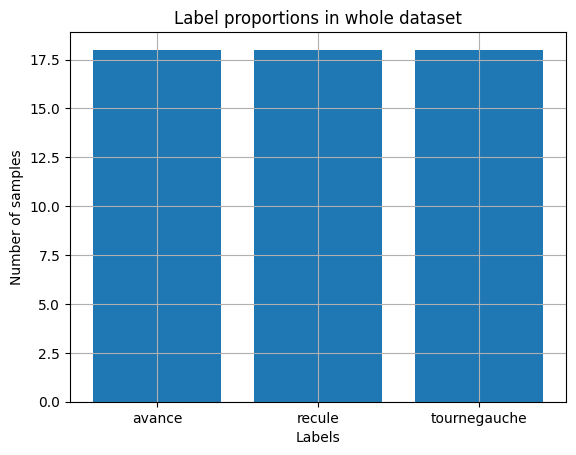

5 3
5 3
5 3
13 7
13 7
13 7
0.42857142857142855
0.3333333333333333


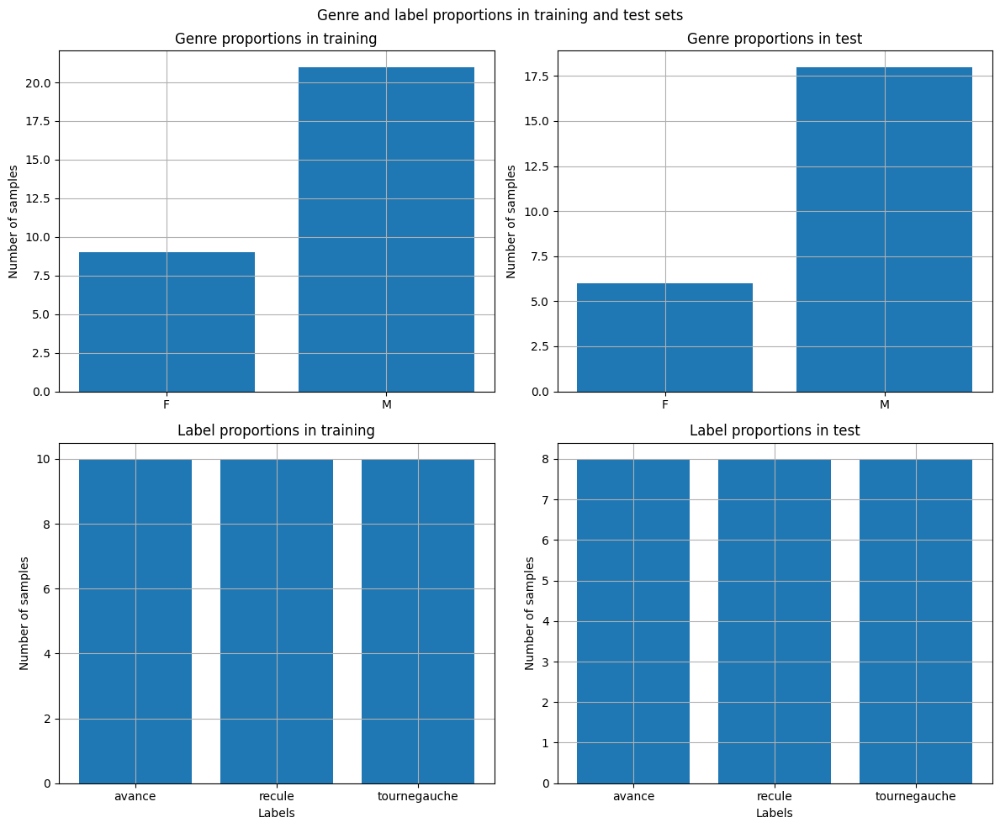

In [152]:
plt.bar([0, 1, 2], [np.sum(y == 0), np.sum(y == 1), np.sum(y == 2)])
plt.title("Label proportions in whole dataset")
plt.xlabel("Labels")
plt.ylabel("Number of samples")
plt.xticks([0, 1, 2], words)
plt.grid()
plt.show()

def cut_dataset(X, y, round_method, train_percentage):
    m = len(X)
    cut = int(round_method(m * train_percentage))

    print(m, cut)

    ind = np.arange(len(X))
    np.random.shuffle(ind)
    X_shuffled = X[ind]
    y_shuffled = y[ind]

    X_train = X_shuffled[:cut]
    y_train = y_shuffled[:cut]
    X_test = X_shuffled[cut:]
    y_test = y_shuffled[cut:]
    
    return X_train, y_train, X_test, y_test
    
def cut_men_women(X, y, train_percentage):
    X_train0, y_train0, X_test0, y_test0 = cut_dataset(X[y==0], y[y==0], np.round, train_percentage) 
    X_train1, y_train1, X_test1, y_test1 = cut_dataset(X[y==1], y[y==1], np.round, train_percentage) 
    X_train2, y_train2, X_test2, y_test2 = cut_dataset(X[y==2], y[y==2], np.round, train_percentage) 

    X_train = np.concatenate([X_train0, X_train1, X_train2])
    y_train = np.concatenate([y_train0, y_train1, y_train2])
    X_test = np.concatenate([X_test0, X_test1, X_test2])
    y_test = np.concatenate([y_test0, y_test1, y_test2]) 
    
    return X_train, y_train, X_test, y_test

def get_split(X, y, train_percentage = 0.6):
    X_trainf, y_trainf, X_testf, y_testf = cut_men_women(X[genres=="F"], y[genres=="F"], train_percentage)
    X_trainh, y_trainh, X_testh, y_testh = cut_men_women(X[genres=="M"], y[genres=="M"], train_percentage)
    
    nb_F_train, nb_F_test  = len(X_trainf), len(X_testf)
    
    X_train = np.concatenate([X_trainf, X_trainh])
    y_train = np.concatenate([y_trainf, y_trainh])
    X_test = np.concatenate([X_testf, X_testh])
    y_test = np.concatenate([y_testf, y_testh]) 
    
    return X_train, y_train, X_test, y_test, nb_F_train, nb_F_test

X_train, y_train, X_test, y_test, nb_F_train, nb_F_test = get_split(X, y, 0.55)

print(nb_F_train / (len(X_train) - nb_F_train))
print(nb_F_test / (len(X_test) - nb_F_test))

fig, axes = plt.subplots(2, 2, figsize=(12, 10))
plt.suptitle("Genre and label proportions in training and test sets")

axes[0, 0].bar(["F", "M"], [nb_F_train, len(X_train) - nb_F_train])
axes[0, 0].set_title("Genre proportions in training")
axes[0, 0].set_ylabel("Number of samples")
axes[0, 0].grid()

axes[0, 1].bar(["F", "M"], [nb_F_test, len(X_test) - nb_F_test])
axes[0, 1].set_title("Genre proportions in test")
axes[0, 1].set_ylabel("Number of samples")
axes[0, 1].grid()

axes[1, 0].bar([0, 1, 2], [np.sum(y_train == 0), np.sum(y_train == 1), np.sum(y_train == 2)])
axes[1, 0].set_title("Label proportions in training")
axes[1, 0].set_xlabel("Labels")
axes[1, 0].set_ylabel("Number of samples")
axes[1, 0].set_xticks([0, 1, 2])
axes[1, 0].set_xticklabels(words)
axes[1, 0].grid()

axes[1, 1].bar([0, 1, 2], [np.sum(y_test == 0), np.sum(y_test == 1), np.sum(y_test == 2)])
axes[1, 1].set_title("Label proportions in test")
axes[1, 1].set_xlabel("Labels")
axes[1, 1].set_ylabel("Number of samples")
axes[1, 1].set_xticks([0, 1, 2])
axes[1, 1].set_xticklabels(words)
axes[1, 1].grid()

plt.tight_layout()
plt.show()

from tqdm import tqdm
#from sklearn.metrics import f1_score

def grid_search(X_train, y_train, X_test, y_test):
    best_params = []
    best_scores = []
    for feature in [FFT, STFT, MFCC]:
        print(f"-----{feature}-----")
        best_params_feature, best_score_feature = grid_search_feature(X_train, y_train, X_test, y_test, feature)
        print(feature, best_params_feature, best_score_feature)
        best_params.append(best_params_feature)
        best_scores.append(best_score_feature)
    return best_params, best_scores

def grid_search_feature(X_train, y_train, X_test, y_test, feature):
    best_params = []
    best_score = -np.inf
    
    params = []
    
    if feature != FFT:
        statistics = [my_max, my_min, my_mean, my_median, min_max, my_std, med_std]
    else:
        statistics = [None]
    
    for taille in range(10, 500, 50):
        for statistic in statistics:
            for penalty in ["l1", "l2", None]:
                if penalty:
                    for C in [0.1, 1, 5, 10, 20]:
                        params.append([feature, taille, statistic, penalty, C])
                else:
                    params.append([feature, taille, statistic, None, 1])                      
                        
    for feature, taille, statistic, penalty, C in tqdm(params):
        scaler = StandardScaler()
        regression = LogisticRegression(penalty=penalty, C=C, solver="saga", max_iter=1000)
        if feature == FFT:
            preprocessor = feature(taille)
        else:
            preprocessor = feature(statistic, taille)
        preprocessor.fit(X_train)
        scaled_preprocessed_X_train = scaler.fit_transform(preprocessor.transform(X_train))
        scaled_preprocessed_X_test = scaler.transform(preprocessor.transform(X_test))
        model = regression.fit(scaled_preprocessed_X_train, y_train)
        prediction = model.predict(scaled_preprocessed_X_test)
        accuracy = accuracy_score(y_test, prediction)
        
        if accuracy == 1 and best_score == 1:
            best_params.append((feature, taille, statistic, penalty, C))
        if accuracy > best_score:
            best_score = accuracy
            best_params = [(feature, taille, statistic, penalty, C)]
    
    return best_params, best_score

best_params, best_scores = grid_search(X_train, y_train, X_test, y_test)
print(best_params, best_scores)

In [91]:
from tqdm import tqdm
#from sklearn.metrics import f1_score

def grid_search(X_train, y_train, X_test, y_test):
    best_params = []
    best_scores = []
    for feature in [FFT, STFT, MFCC]:
        print(f"-----{feature}-----")
        best_params_feature, best_score_feature = grid_search_feature(X_train, y_train, X_test, y_test, feature)
        print(feature, best_params_feature, best_score_feature)
        best_params.append(best_params_feature)
        best_scores.append(best_score_feature)
    return best_params, best_scores

def grid_search_feature(X_train, y_train, X_test, y_test, feature):
    best_params = []
    best_score = -np.inf
    
    params = []
    
    if feature != FFT:
        statistics = [my_max, my_min, my_mean, my_median, min_max, my_std, med_std]
    else:
        statistics = [None]
    
    for taille in range(10, 500, 50):
        for statistic in statistics:
            for penalty in ["l1", "l2", None]:
                if penalty:
                    for C in [0.1, 1, 5, 10, 20]:
                        params.append([feature, taille, statistic, penalty, C])
                else:
                    params.append([feature, taille, statistic, None, 1])                      
                        
    for feature, taille, statistic, penalty, C in tqdm(params):
        scaler = StandardScaler()
        regression = LogisticRegression(penalty=penalty, C=C, solver="saga", max_iter=1000)
        if feature == FFT:
            preprocessor = feature(taille)
        else:
            preprocessor = feature(statistic, taille)
        preprocessor.fit(X_train)
        scaled_preprocessed_X_train = scaler.fit_transform(preprocessor.transform(X_train))
        scaled_preprocessed_X_test = scaler.transform(preprocessor.transform(X_test))
        model = regression.fit(scaled_preprocessed_X_train, y_train)
        prediction = model.predict(scaled_preprocessed_X_test)
        accuracy = accuracy_score(y_test, prediction)
        
        if accuracy == 1 and best_score == 1:
            best_params.append((feature, taille, statistic, penalty, C))
        if accuracy > best_score:
            best_score = accuracy
            best_params = [(feature, taille, statistic, penalty, C)]
    
    return best_params, best_score

best_params, best_scores = grid_search(X_train, y_train, X_test, y_test)
print(best_params, best_scores)

-----<class '__main__.FFT'>-----


  0%|          | 0/110 [00:00<?, ?it/s]


ValueError: Found input variables with inconsistent numbers of samples: [10, 30]

Finally apply a logistic regression with **Leave one out Cross validation** on :

1. The first PCA components of FFT (try multiple "n_compenents")
2. Different statistics and maximum frequency of the STFT
3. Different statistics and the number of selected features of the MFCC.
3. The same as before with scaling

In each situations try different regularization coefficient C.

Use the **Pipeline** of sklearn to wrap the preprocessing and the classifier altogether and **GridSearchCV** to perform the grid search.  
You can access to all results with "cv_results_"

In [ ]:
from sklearn.exceptions import ConvergenceWarning
warnings.filterwarnings("ignore", category=ConvergenceWarning)

from sklearn.model_selection import LeaveOneOut

def FFT_grid_search(scale=False):
    if scale:
        estimators = [('fft', FFT()), ("scaler", StandardScaler()), 
                      ('pca', PCA()), ('regression', LogisticRegression(solver="saga", max_iter=1000))]
    else:
        estimators = [('fft', FFT()), ('pca', PCA()), ('regression', LogisticRegression())]

    pipeline = Pipeline(estimators)
    params = {'pca__n_components': [n for n in range(25, 250, 25)],
              'regression__penalty': ["l1", "l2", None],
              'regression__C': [0.1, 1, 5, 10]}
    
    FFT_grid_search = GridSearchCV(pipeline, params, scoring="accuracy", cv=LeaveOneOut(), verbose=0, n_jobs=-1)
    return FFT_grid_search

FFT_CV = FFT_grid_search()
FFT_model = FFT_CV.fit(X, y)
print(f"Best parameters for FFT: {FFT_model.best_params_}")
print(f"Best score for FFT: {FFT_model.best_score_}")

FFT_CV_scaled = FFT_grid_search(True)
FFT_model_scaled = FFT_CV_scaled.fit(X, y)
print(f"Best parameters for scaled FFT: {FFT_model_scaled.best_params_}")
print(f"Best score for scaled FFT: {FFT_model_scaled.best_score_}")

/Users/victorlin/miniforge3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Users/victorlin/miniforge3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#l

Best parameters for FFT: {'ACP__n_components': 25, 'Regression__C': 10, 'Regression__penalty': None}
Best score for FFT: 0.7777777777777778


/Users/victorlin/miniforge3/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/victorlin/miniforge3/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/victorlin/miniforge3/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/victorlin/miniforge3/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/victorlin/miniforge3/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/victorlin/miniforge3/lib/python3.

Best parameters for scaled FFT: {'ACP__n_components': 25, 'Regression__C': 0.1, 'Regression__penalty': 'l1'}
Best score for scaled FFT: 0.7962962962962963


In [99]:
from sklearn.model_selection import LeaveOneOut

def feature_grid_search(feature, scale=False):
    if scale:
        estimators = [('feature', feature(my_max, 0)), ("scaler", StandardScaler()), 
                      ('regression', LogisticRegression(solver="saga", max_iter=1000))]
    else:
        estimators = [('feature', feature(my_max, 0)), 
                      ('regression', LogisticRegression(solver="saga", max_iter=1000))]
        
    pipeline = Pipeline(estimators)

    if feature == STFT:
        size_param = "feature__idx_frequence_max"
    else:
        size_param = "feature__n_mfcc"

    params = {'feature__time_statistics': [my_median, min_max, med_std],
              size_param: [n for n in range(10, 500, 100)],
             'regression__penalty': ["l1", "l2", None],
             'regression__C': [0.1, 1, 5, 10]}
    
    feature_grid_search = GridSearchCV(pipeline, params, scoring="accuracy", cv=LeaveOneOut(), verbose=0, n_jobs=-1)
    return feature_grid_search

STFT_CV = feature_grid_search(STFT)
STFT_model = STFT_CV.fit(X, y)
print(f"Best parameters for STFT: {STFT_model.best_params_}")
print(f"Best score for STFT: {STFT_model.best_score_}")

STFT_CV_scaled = feature_grid_search(STFT, True)
STFT_model_scaled = STFT_CV_scaled.fit(X, y)
print(f"Best parameters for scaled STFT: {STFT_model_scaled.best_params_}")
print(f"Best score for scaled STFT: {STFT_model_scaled.best_score_}")

MFCC_CV = feature_grid_search(MFCC)
MFCC_model = MFCC_CV.fit(X, y)
print(f"Best parameters for MFCC: {MFCC_model.best_params_}")
print(f"Best score for MFCC: {MFCC_model.best_score_}")

MFCC_CV_scaled = feature_grid_search(MFCC, True)
MFCC_model_scaled = MFCC_CV_scaled.fit(X, y)
print(f"Best parameters for scaled MFCC: {MFCC_model_scaled.best_params_}")
print(f"Best score for scaled MFCC: {MFCC_model_scaled.best_score_}")

/Users/victorlin/miniforge3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/victorlin/miniforge3/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/victorlin/miniforge3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/victorlin/miniforge3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/victorlin/miniforge3/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/victorlin/miniforge3/lib/python3.12/sit

Best parameters for STFT: {'feature__idx_frequence_max': 110, 'feature__time_statistics': <function min_max at 0x13af5ab60>, 'lr__C': 0.1, 'lr__penalty': 'l1'}
Best score for STFT: 0.8333333333333334


/Users/victorlin/miniforge3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/victorlin/miniforge3/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/victorlin/miniforge3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/victorlin/miniforge3/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/victorlin/miniforge3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/victorlin/miniforge3/lib/python3.12/sit

Best parameters for scaled STFT: {'feature__idx_frequence_max': 310, 'feature__time_statistics': <function med_std at 0x12cd271a0>, 'lr__C': 0.1, 'lr__penalty': 'l2'}
Best score for scaled STFT: 0.9444444444444444


/Users/victorlin/miniforge3/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/victorlin/miniforge3/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/victorlin/miniforge3/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/victorlin/miniforge3/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/victorlin/miniforge3/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/victorlin/miniforge3/lib/python3.

Best parameters for MFCC: {'feature__n_mfcc': 10, 'feature__time_statistics': <function med_std at 0x12cd271a0>, 'lr__C': 0.1, 'lr__penalty': 'l2'}
Best score for MFCC: 0.8888888888888888


/Users/victorlin/miniforge3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/victorlin/miniforge3/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/victorlin/miniforge3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/victorlin/miniforge3/lib/python3.12/site-packages/sklearn/linear_model/_sag.py:348: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/Users/victorlin/miniforge3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:1207: UserWarning: Setting penalty=None will ignore the C and l1_ratio parameters
  warnings.warn(
/Users/victorlin/miniforge3/lib/python3.12/sit

Best parameters for scaled MFCC: {'feature__n_mfcc': 10, 'feature__time_statistics': <function med_std at 0x12cd271a0>, 'lr__C': 10, 'lr__penalty': 'l1'}
Best score for scaled MFCC: 0.9629629629629629


### Evaluation of results

Evaluate the result by confusion matrix and percentage of correct classification.

*Tip:* Remember to put a function to display the confusion matrix

def best_leave_one_out(X, preprocessor, y, penalty="l2", C=1, max_iter=1000):
    preprocessor.fit(X)
    preprocessed_X = preprocessor.transform(X)
    scaler = StandardScaler()
    regression = LogisticRegression(penalty=penalty, C=C, solver="saga", max_iter=max_iter)
    predictions = []
    n , p = preprocessed_X.shape
    for i in range(n):
        y_train = np.delete(y, i, axis=0)
        y_test = y[i]
        preprocessed_X_train = np.delete(preprocessed_X, i, axis=0)
        scaled_preprocessed_X_train = scaler.fit_transform(preprocessed_X_train)
        preprocessed_X_test = [preprocessed_X[i, :]]
        scaled_preprocessed_X_test = scaler.transform(preprocessed_X_test)
        model = regression.fit(scaled_preprocessed_X_train, y_train)
        prediction = model.predict(scaled_preprocessed_X_test)
        predictions.extend(prediction)
    return model, predictions, accuracy_score(y, predictions)

best_preprocessor_STFT = STFT(min_max, 110)
best_model_STFT, best_predictions_STFT, best_accuracy_STFT = best_leave_one_out(X, best_preprocessor_STFT, y, "l1", 0.1)
print(f"Best parameters for STFT: {STFT_CV.best_params_}")
print(f"Best score for STFT: {best_accuracy_STFT}")
print(f"Best predictions for STFT: {best_predictions_STFT}")

Best score for FFT: 0.7777777777777778


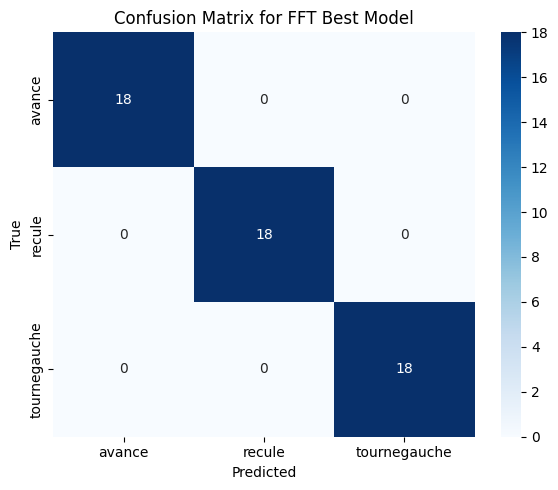

Best score for scaled FFT: 0.7962962962962963


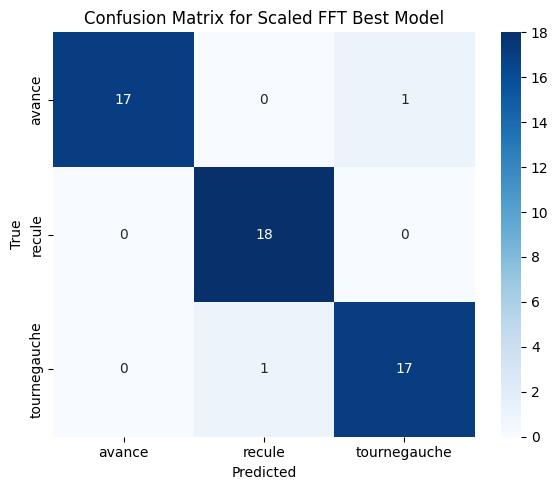

Best score for scaled STFT: 0.8333333333333334


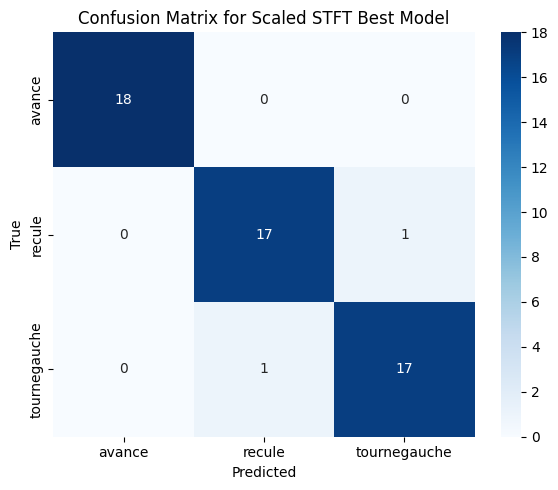

Best score for scaled STFT: 0.9444444444444444


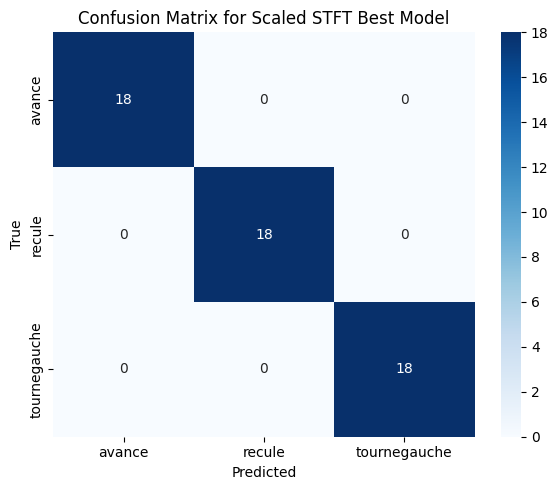

Best score for MFCC: 0.8888888888888888


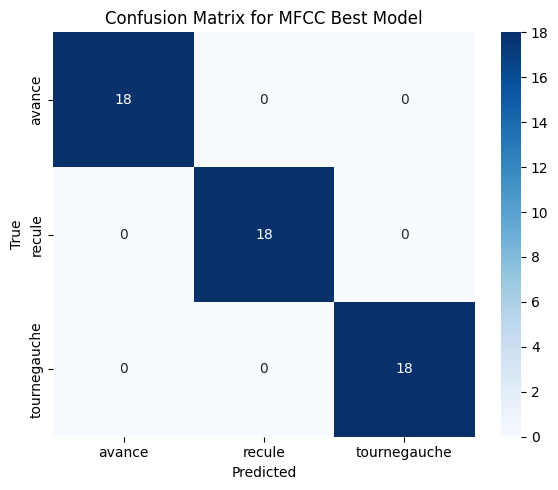

Best score for scaled MFCC: 0.9629629629629629


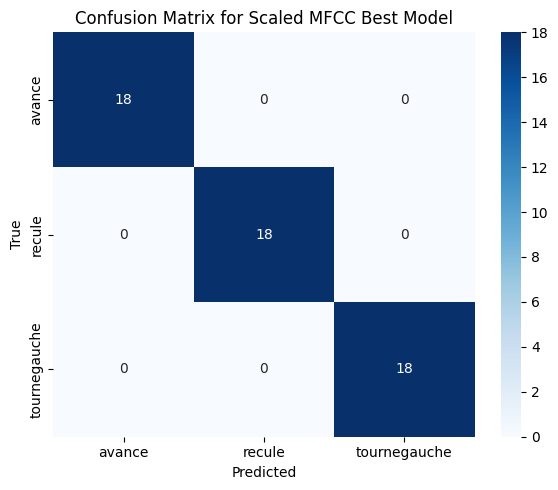

In [ ]:
# Evaluation des résultats par matrices de confusion 
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix

def plot_confusion_matrix(y_true, y_pred, labels=None, title="Confusion Matrix"):
    matrix = confusion_matrix(y_true, y_pred)
    plt.figure(figsize=(6, 5))
    sns.heatmap(matrix, annot=True, fmt="d", cmap="Blues", 
                xticklabels=labels if labels else np.unique(y_true), 
                yticklabels=labels if labels else np.unique(y_true))
    plt.xlabel("Predicted")
    plt.ylabel("True")
    plt.title(title)
    plt.tight_layout()
    plt.show()
    return matrix

# Best parameters for FFT: {'ACP__n_components': 25, 'Regression__C': 10, 'Regression__penalty': None}
# Best score for FFT: 0.7777777777777778

best_prediction_FFT = FFT_model.predict(X)
print(f"Best score for FFT: {FFT_model.best_score_}")
ConfusionMatrix_best_FFT = plot_confusion_matrix(y, best_prediction_FFT, labels=words, title="Confusion Matrix for FFT Best Model")

# Best parameters for scaled FFT: {'ACP__n_components': 25, 'Regression__C': 0.1, 'Regression__penalty': 'l1'}
# Best score for scaled FFT: 0.7962962962962963

best_prediction_FFT_scaled = FFT_model_scaled.predict(X)
print(f"Best score for scaled FFT: {FFT_model_scaled.best_score_}")
ConfusionMatrix_best_FFT_scaled = plot_confusion_matrix(y, best_prediction_FFT_scaled, labels=words, title="Confusion Matrix for Scaled FFT Best Model")

# Best parameters for STFT: {'feature__idx_frequence_max': 110, 'feature__time_statistics': <function min_max at 0x13af5ab60>, 'lr__C': 0.1, 'lr__penalty': 'l1'}
# Best score for STFT: 0.8333333333333334

best_prediction_STFT = STFT_model.predict(X)
print(f"Best score for scaled STFT: {STFT_model.best_score_}")
ConfusionMatrix_best_STFT = plot_confusion_matrix(y, best_prediction_STFT, labels=words, title="Confusion Matrix for Scaled STFT Best Model")

# Best parameters for scaled STFT: {'feature__idx_frequence_max': 310, 'feature__time_statistics': <function med_std at 0x12cd271a0>, 'lr__C': 0.1, 'lr__penalty': 'l2'}
# Best score for scaled STFT: 0.9444444444444444

best_prediction_STFT_scaled = STFT_model_scaled.predict(X)
print(f"Best score for scaled STFT: {STFT_model_scaled.best_score_}")
ConfusionMatrix_best_STFT_scaled = plot_confusion_matrix(y, best_prediction_STFT_scaled, labels=words, title="Confusion Matrix for Scaled STFT Best Model")

# Best parameters for MFCC: {'feature__n_mfcc': 10, 'feature__time_statistics': <function med_std at 0x12cd271a0>, 'lr__C': 0.1, 'lr__penalty': 'l2'}
# Best score for MFCC: 0.8888888888888888

best_prediction_MFCC = MFCC_model.predict(X)
print(f"Best score for MFCC: {MFCC_model.best_score_}")
ConfusionMatrix_best_MFCC = plot_confusion_matrix(y, best_prediction_MFCC, labels=words, title="Confusion Matrix for MFCC Best Model")

# Best parameters for scaled MFCC: {'feature__n_mfcc': 10, 'feature__time_statistics': <function med_std at 0x12cd271a0>, 'lr__C': 10, 'lr__penalty': 'l1'}
# Best score for scaled MFCC: 0.9629629629629629

best_prediction_MFCC_scaled = MFCC_model_scaled.predict(X)
print(f"Best score for scaled MFCC: {MFCC_model_scaled.best_score_}")
ConfusionMatrix_best_MFCC_scaled = plot_confusion_matrix(y, best_prediction_MFCC_scaled, labels=words, title="Confusion Matrix for Scaled MFCC Best Model")

# Part II: Classification by kernel methods

**Reminder** Kernel methods consist of plunging the data into a space of Hilbert dimension $\mathcal{H}$ where the data can be separated linearly.

**Representation Theorem:** The solution of the infinite dimensional separation problem is contained in a finite dimensional vector subspace of $\mathcal{H}$

### 1. Perform a core SVM classification

    1) Vary the core
    2) Vary the regularization parameter.

In [102]:
from sklearn.svm import SVC

In [146]:
X_train_raw = X_train
X_test_raw = X_test

kernels = ['linear', 'rbf', 'poly', 'sigmoid']
C_values = [0.01, 0.1, 1, 10, 100]

results = []
for kernel in kernels:
    for C in C_values:
        svm = SVC(kernel=kernel, C=C, random_state=42)
        svm.fit(X_train_raw, y_train)
        y_pred = svm.predict(X_test_raw)
        acc = accuracy_score(y_test, y_pred)
        results.append({'kernel': kernel, 'C': C, 'accuracy': acc})
        print(f"Kernel: {kernel}, C: {C}, Accuracy: {acc:.3f}")

best_result = max(results, key=lambda x: x['accuracy'])
print(f"\nBest SVM result: Kernel={best_result['kernel']}, C={best_result['C']}, Accuracy={best_result['accuracy']:.3f}")

Kernel: linear, C: 0.01, Accuracy: 0.292
Kernel: linear, C: 0.1, Accuracy: 0.458
Kernel: linear, C: 1, Accuracy: 0.292
Kernel: linear, C: 10, Accuracy: 0.292
Kernel: linear, C: 100, Accuracy: 0.292
Kernel: rbf, C: 0.01, Accuracy: 0.375
Kernel: rbf, C: 0.1, Accuracy: 0.375
Kernel: rbf, C: 1, Accuracy: 0.375
Kernel: rbf, C: 10, Accuracy: 0.333
Kernel: rbf, C: 100, Accuracy: 0.333
Kernel: poly, C: 0.01, Accuracy: 0.333
Kernel: poly, C: 0.1, Accuracy: 0.333
Kernel: poly, C: 1, Accuracy: 0.333
Kernel: poly, C: 10, Accuracy: 0.333
Kernel: poly, C: 100, Accuracy: 0.333
Kernel: sigmoid, C: 0.01, Accuracy: 0.333
Kernel: sigmoid, C: 0.1, Accuracy: 0.333
Kernel: sigmoid, C: 1, Accuracy: 0.375
Kernel: sigmoid, C: 10, Accuracy: 0.292
Kernel: sigmoid, C: 100, Accuracy: 0.292

Best SVM result: Kernel=linear, C=0.1, Accuracy=0.458


Best result: Kernel: linear, C: 0.01, Accuracy: 0.833


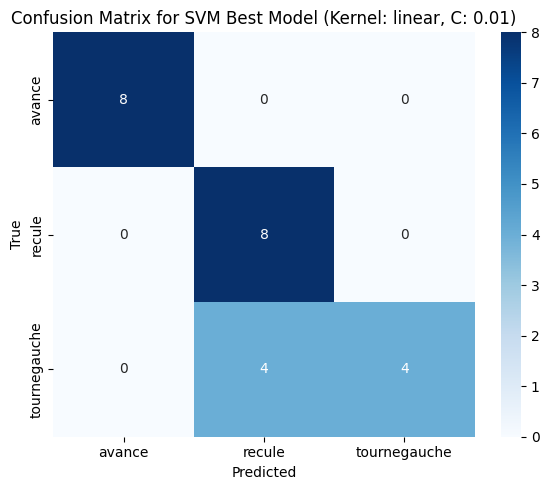

Best result: Kernel: linear, C: 0.01, Accuracy: 0.917


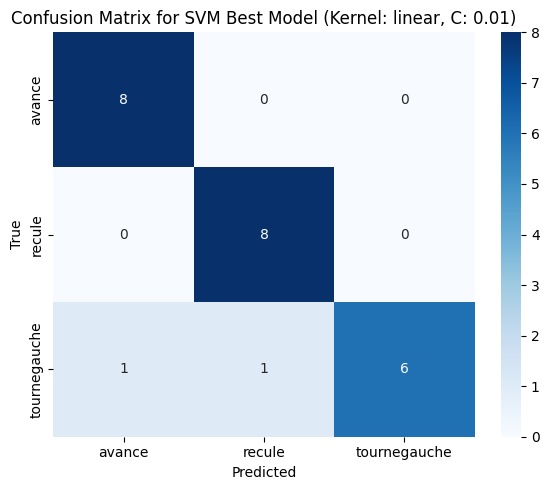

Best result: Kernel: linear, C: 0.1, Accuracy: 0.750


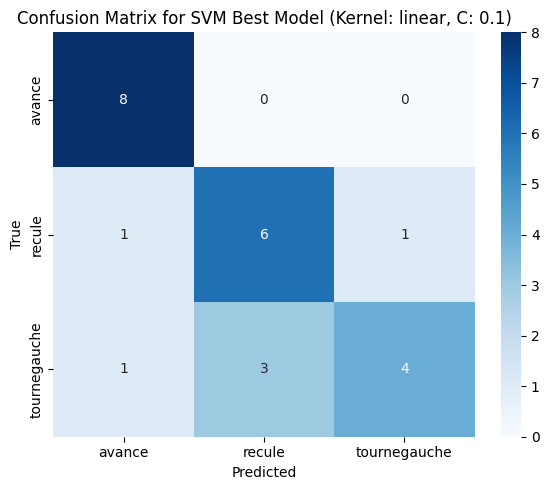

([{'kernel': 'linear',
   'C': 0.01,
   'accuracy': 0.7083333333333334,
   'y_predicted': array([0, 0, 2, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 1, 2, 2, 1,
          2, 1])},
  {'kernel': 'linear',
   'C': 0.1,
   'accuracy': 0.75,
   'y_predicted': array([0, 0, 1, 1, 2, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0, 2, 1, 2, 2, 1,
          2, 1])},
  {'kernel': 'linear',
   'C': 1,
   'accuracy': 0.75,
   'y_predicted': array([0, 0, 1, 1, 2, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0, 2, 1, 2, 2, 1,
          2, 1])},
  {'kernel': 'linear',
   'C': 10,
   'accuracy': 0.75,
   'y_predicted': array([0, 0, 1, 1, 2, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0, 2, 1, 2, 2, 1,
          2, 1])},
  {'kernel': 'linear',
   'C': 100,
   'accuracy': 0.75,
   'y_predicted': array([0, 0, 1, 1, 2, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0, 2, 1, 2, 2, 1,
          2, 1])},
  {'kernel': 'rbf',
   'C': 0.01,
   'accuracy': 0.625,
   'y_predicted': array([0, 0, 1, 0, 1, 2, 0, 0, 0, 0, 0, 0, 2, 1, 1, 1, 0, 2, 1, 2, 2, 1,
      

In [ ]:
def svm_grid_search(preprocessor, X_train, y_train, X_test, y_test, 
                    kernels=['linear', 'rbf', 'poly', 'sigmoid'], 
                    C_values=[0.01, 0.1, 1, 10, 100]):
    preprocessor.fit(X_train)
    preprocessed_X_train = preprocessor.transform(X_train)
    preprocessed_X_test = preprocessor.transform(X_test)
    results = []

    for kernel in kernels:
        for C in C_values:
            svm = SVC(kernel=kernel, C=C, random_state=42)
            model = svm.fit(preprocessed_X_train, y_train)
            y_predicted = model.predict(preprocessed_X_test)
            accuracy = accuracy_score(y_test, y_predicted)
            results.append({'kernel': kernel, 'C': C, 'accuracy': accuracy, 'y_predicted': y_predicted})
            #print(f"Kernel: {kernel}, C: {C}, Accuracy: {accuracy:.3f}")

    best_result = max(results, key=lambda x: x['accuracy'])
    print(f"Best result: Kernel: {best_result['kernel']}, C: {best_result['C']}, Accuracy: {best_result['accuracy']:.3f}")
    plot_confusion_matrix(y_test, best_result['y_predicted'], labels=words,
                          title=f"Confusion Matrix for SVM Best Model (Kernel: {best_result['kernel']}, C: {best_result['C']})")
    return results, best_result

preprocessor_FFT = FFT(40)
svm_grid_search(preprocessor_FFT, X_train, y_train, X_test, y_test)

preprocessor_MFCC = MFCC(med_std, 10)
svm_grid_search(preprocessor_MFCC, X_train, y_train, X_test, y_test)

preprocessor_STFT = STFT(med_std, 110)
svm_grid_search(preprocessor_STFT, X_train, y_train, X_test, y_test)

# Part III: Ensemble Method

## 1. Bootstrap Aggregation : Bagging

Boostrap consists in creating multiple data sets as follows. Suppose our
original data set consists of $N$ data points $X = \{x_1,..., x_N \}$. We can create a new
data set $X_B$ by drawing $N$ points at random from X, with replacement, so that some
points in $X$ may be replicated in $X_B$, whereas other points in $X$ may be absent from
$X_B$. This process can be repeated $L$ times to generate $L$ data sets each of size $N$ and
each obtained by sampling from the original data set $X$.

Consider a binary classification problem in which we are trying to predict the class, and suppose we generate $M$ bootstrap data sets and then use each to train a separate copy $y_m(x)$ of a classifier where $m = 1,...,M$. The committee prediction is given by voting with all $M$ models.

1. First you will transform $y$ in $y^1$ as follow
if $y = 1$, then $y^1 = 1$
if $y = 0$ or $y = 2$, then $y^1 = 0$
Now we can apply binary classification

2. Code from scratch the Bagging of Decision trees with *max_depth = 2* only and compare the accuracy of the bagging model with the mean accuracy of the models and conclude. (the bootstrap is done on the training set with np.random.choice, and use $M=100$)

3. Apply Random Forest on the initial classification problem (3 classes) and adjust the hyperparameters. Is random Forest a Bagging model?



In [115]:
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier

In [148]:
### 1. create y1

y1 = np.where(y==1, 1, 0)

In [149]:
### 2. 
X_train, X_test, y_train, y_test = train_test_split(X,y1,test_size=0.4, random_state=42)
np.random.seed(seed=42)

Bagging accuracy (majority vote): 0.591
Mean individual tree accuracy: 0.517


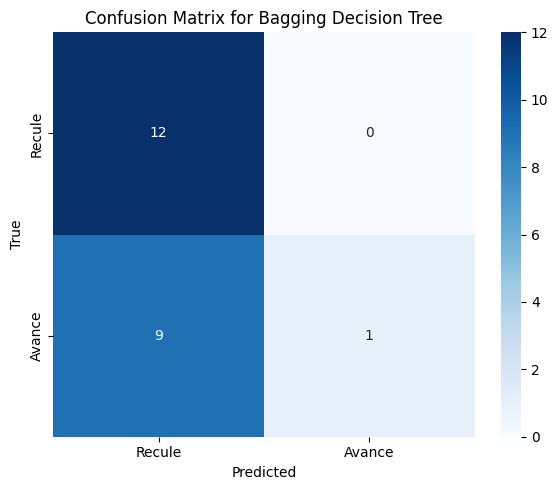

array([[12,  0],
       [ 9,  1]])

In [150]:
from scipy.stats import mode

M = 100
n_train = len(X_train)
n_test = len(X_test)
bagging_predictions = np.zeros((M, n_test), dtype=int)
bagging_accuracies = []

for m in range(M):
    indices = np.random.choice(n_train, size=n_train, replace=True)
    X_bootstrap = X_train[indices]
    y_bootstrap = y_train[indices]
    
    tree = DecisionTreeClassifier(max_depth=2)#, random_state=m)
    model = tree.fit(X_bootstrap, y_bootstrap)
    
    predictions = model.predict(X_test)
    bagging_predictions[m] = predictions
    
    accuracy = accuracy_score(y_test, predictions)
    bagging_accuracies.append(accuracy)

y_predicted, _ = mode(bagging_predictions, axis=0, keepdims=False)
bagging_accuracy = accuracy_score(y_test, y_predicted)
mean_bagging_accuracies = np.mean(bagging_accuracies)

print(f"Bagging accuracy (majority vote): {bagging_accuracy:.3f}")
print(f"Mean individual tree accuracy: {mean_bagging_accuracies:.3f}")
plot_confusion_matrix(y_test, y_predicted, labels=["Recule", "Avance"], title="Confusion Matrix for Bagging Decision Tree")

Bagging accuracy with FFT preprocessor: 0.727
Mean individual tree accuracy with FFT preprocessor: 0.652


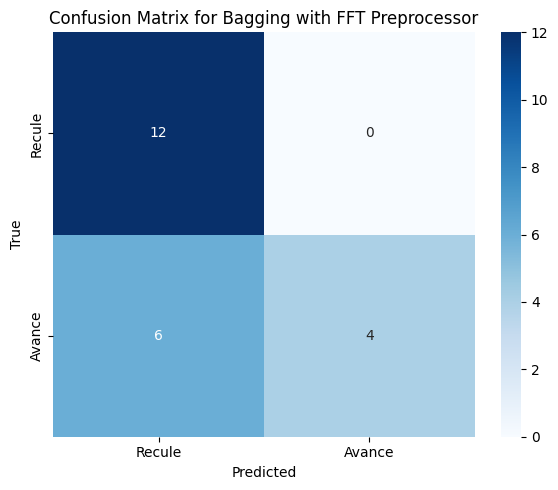

Bagging accuracy with STFT preprocessor: 0.682
Mean individual tree accuracy with STFT preprocessor: 0.644


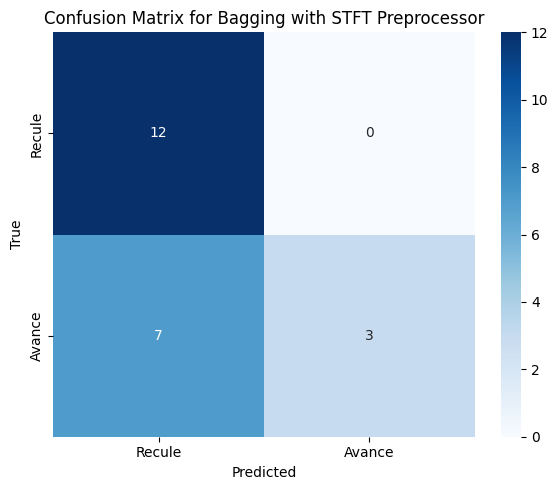

Bagging accuracy with MFCC preprocessor: 0.773
Mean individual tree accuracy with MFCC preprocessor: 0.811


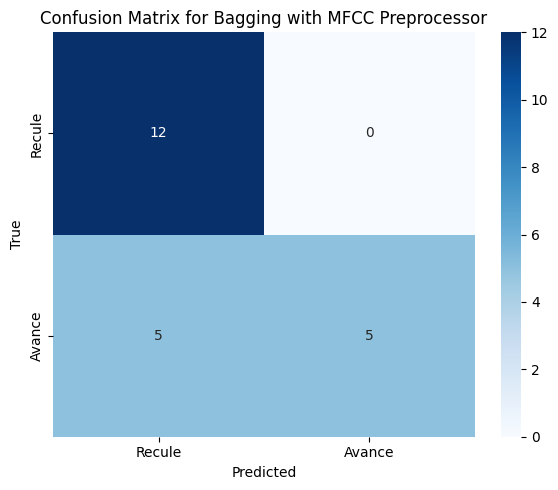

array([[12,  0],
       [ 5,  5]])

In [151]:
from scipy.stats import mode

def bagging_with_preprocessing(X_train, X_test, y_train, y_test, 
                               preprocessor, M=100, tree_depth=2, random_state=42):
    np.random.seed(random_state)
    preprocessor.fit(X_train)
    preprocessed_X_train = preprocessor.transform(X_train)
    preprocessed_X_test = preprocessor.transform(X_test)
    n_train = len(preprocessed_X_train)
    n_test = len(preprocessed_X_test)
    bagging_predictions = np.zeros((M, n_test), dtype=int)
    bagging_accuracies = []

    for m in range(M):
        indices = np.random.choice(n_train, size=n_train, replace=True)
        X_bootstrap = preprocessed_X_train[indices]
        y_bootstrap = y_train[indices]
        tree = DecisionTreeClassifier(max_depth=tree_depth)
        model = tree.fit(X_bootstrap, y_bootstrap)
        predictions = model.predict(preprocessed_X_test)
        bagging_predictions[m] = predictions
        accuracy = accuracy_score(y_test, predictions)
        bagging_accuracies.append(accuracy)

    y_predicted, _ = mode(bagging_predictions, axis=0, keepdims=False)
    bagging_accuracy = accuracy_score(y_test, y_predicted)
    mean_individual_accuracy = np.mean(bagging_accuracies)
    return bagging_accuracy, mean_individual_accuracy, y_predicted, bagging_predictions

preprocessor_FFT = FFT(40)
bagging_accuracy_FFT, mean_individual_accuracy_FFT, y_predicted_FFT, bagging_predictions_FFT = bagging_with_preprocessing(
    X_train, X_test, y_train, y_test, preprocessor_FFT)
print(f"Bagging accuracy with FFT preprocessor: {bagging_accuracy_FFT:.3f}")
print(f"Mean individual tree accuracy with FFT preprocessor: {mean_individual_accuracy_FFT:.3f}")

plot_confusion_matrix(y_test, y_predicted_FFT, labels=["Recule", "Avance"], title="Confusion Matrix for Bagging with FFT Preprocessor")

preprocessor_STFT = STFT(med_std, 460)
bagging_accuracy_STFT, mean_individual_accuracy_STFT, y_predicted_STFT, bagging_predictions_STFT = bagging_with_preprocessing(
    X_train, X_test, y_train, y_test, preprocessor_STFT)
print(f"Bagging accuracy with STFT preprocessor: {bagging_accuracy_STFT:.3f}")
print(f"Mean individual tree accuracy with STFT preprocessor: {mean_individual_accuracy_STFT:.3f}")

plot_confusion_matrix(y_test, y_predicted_STFT, labels=["Recule", "Avance"], title="Confusion Matrix for Bagging with STFT Preprocessor")

preprocessor_MFCC = MFCC(med_std, 10)
bagging_accuracy_MFCC, mean_individual_accuracy_MFCC, y_predicted_MFCC, bagging_predictions_MFCC = bagging_with_preprocessing(
    X_train, X_test, y_train, y_test, preprocessor_MFCC)
print(f"Bagging accuracy with MFCC preprocessor: {bagging_accuracy_MFCC:.3f}")
print(f"Mean individual tree accuracy with MFCC preprocessor: {mean_individual_accuracy_MFCC:.3f}")

plot_confusion_matrix(y_test, y_predicted_MFCC, labels=["Recule", "Avance"], title="Confusion Matrix for Bagging with MFCC Preprocessor")

from sklearn.ensemble import RandomForestClassifier

# Try different hyperparameters for Random Forest
param_grid = {'n_estimators': [50, 100, 200],
              'max_depth': [2, 5, 10, None],
              'min_samples_split': [2, 5, 10],
              'max_features': ['sqrt', 'log2', None]}

best_score = 0
best_params = None
for n_estimators in param_grid['n_estimators']:
    for max_depth in param_grid['max_depth']:
        for min_samples_split in param_grid['min_samples_split']:
            for max_features in param_grid['max_features']:
                forest = RandomForestClassifier(
                    n_estimators=n_estimators,
                    max_depth=max_depth,
                    min_samples_split=min_samples_split,
                    max_features=max_features,
                    random_state=42
                )
                forest.fit(X_train, y_train)
                score = forest.score(X_test, y_test)
                if score > best_score:
                    best_score = score
                    best_params = {
                        'n_estimators': n_estimators,
                        'max_depth': max_depth,
                        'min_samples_split': min_samples_split,
                        'max_features': max_features
                    }

print(f"Best Random Forest parameters: {best_params}")
print(f"Best Random Forest accuracy: {best_score:.3f}")

# Predict and plot confusion matrix
y_pred_forest = forest.predict(X_test)
plot_confusion_matrix(y_test, y_pred_forest, labels=words, title="Confusion Matrix for Random Forest")

Best Random Forest parameters: {'max_depth': 5, 'max_features': 'log2', 'min_samples_split': 10, 'n_estimators': 200}
Best Random Forest accuracy: 0.600


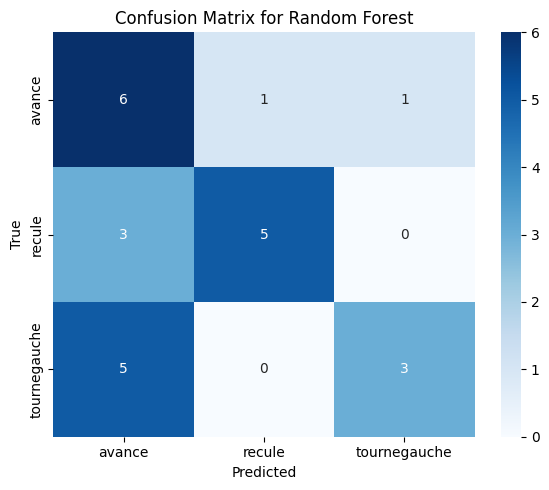

array([[6, 1, 1],
       [3, 5, 0],
       [5, 0, 3]])

In [153]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV

param_grid_forest = {
    'n_estimators': [50, 100, 200],
    'max_depth': [2, 5, 10, None],
    'min_samples_split': [2, 5, 10],
    'max_features': ['sqrt', 'log2', None]
}

forest = RandomForestClassifier(random_state=42)
forest_grid_search = GridSearchCV(forest, param_grid_forest, cv=5, scoring='accuracy', n_jobs=-1)
forest_grid_search.fit(X_train, y_train)

print(f"Best Random Forest parameters: {forest_grid_search.best_params_}")
print(f"Best Random Forest accuracy: {forest_grid_search.best_score_:.3f}")

y_predicted_forest = forest_grid_search.best_estimator_.predict(X_test)
plot_confusion_matrix(y_test, y_predicted_forest, labels=words, title="Confusion Matrix for Random Forest")

Best Random Forest parameters: {'forest__max_depth': 2, 'forest__max_features': None, 'forest__min_samples_split': 10, 'forest__n_estimators': 200}
Best Random Forest accuracy: 0.700


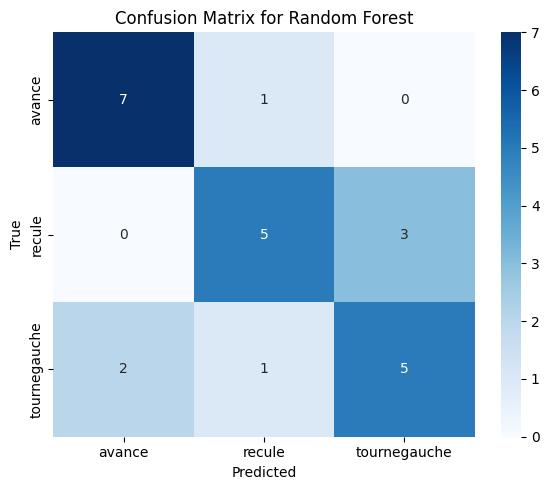

Best Random Forest parameters: {'forest__max_depth': 2, 'forest__max_features': 'sqrt', 'forest__min_samples_split': 2, 'forest__n_estimators': 200}
Best Random Forest accuracy: 0.833


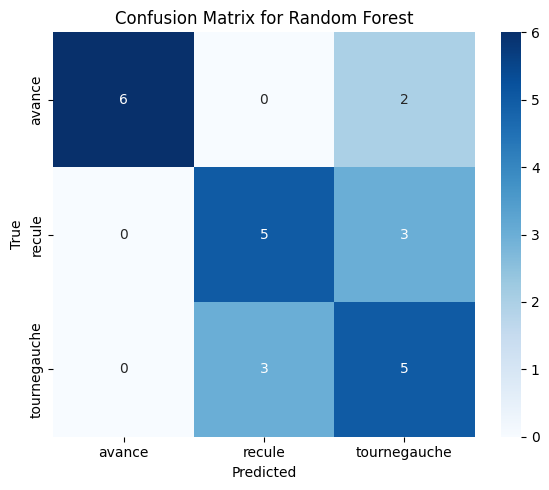

Best Random Forest parameters: {'forest__max_depth': 2, 'forest__max_features': 'sqrt', 'forest__min_samples_split': 2, 'forest__n_estimators': 100}
Best Random Forest accuracy: 0.900


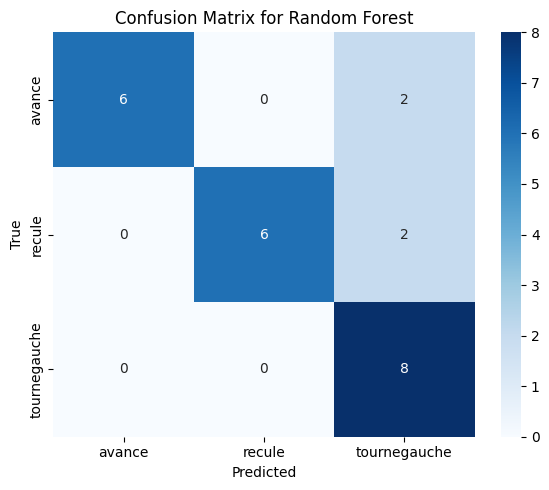

(GridSearchCV(cv=5,
              estimator=Pipeline(steps=[('preprocessor',
                                         MFCC(n_mfcc=10,
                                              time_statistics=<function med_std at 0x12cd271a0>)),
                                        ('forest',
                                         RandomForestClassifier(random_state=42))]),
              n_jobs=-1,
              param_grid={'forest__max_depth': [2, 5, 10, None],
                          'forest__max_features': ['sqrt', 'log2', None],
                          'forest__min_samples_split': [2, 5, 10],
                          'forest__n_estimators': [50, 100, 200]},
              scoring='accuracy'),
 array([2, 2, 2, 1, 2, 2, 0, 0, 0, 0, 0, 0, 2, 1, 1, 1, 1, 1, 2, 2, 2, 2,
        2, 2]))

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.pipeline import Pipeline

def grid_search_random_forest(preprocessor, X_train, y_train, X_test, y_test, labels=None):
    param_grid_forest = {
        'forest__n_estimators': [50, 100, 200],
        'forest__max_depth': [2, 5, 10, None],
        'forest__min_samples_split': [2, 5, 10],
        'forest__max_features': ['sqrt', 'log2', None]
    }
    pipeline = Pipeline([
        ('preprocessor', preprocessor),
        ('forest', RandomForestClassifier(random_state=42))
    ])
    grid_search = GridSearchCV(pipeline, param_grid_forest, cv=5, scoring='accuracy', n_jobs=-1)
    grid_search.fit(X_train, y_train)
    print(f"Best Random Forest parameters: {grid_search.best_params_}")
    print(f"Best Random Forest accuracy: {grid_search.best_score_:.3f}")
    y_pred = grid_search.best_estimator_.predict(X_test)
    plot_confusion_matrix(y_test, y_pred, labels=labels, title="Confusion Matrix for Random Forest")
    return grid_search, y_pred

preprocessor_FFT = FFT(40)
grid_search_random_forest(preprocessor_FFT, X_train, y_train, X_test, y_test, labels=words)
preprocessor_STFT = STFT(med_std, 460)
grid_search_random_forest(preprocessor_STFT, X_train, y_train, X_test, y_test, labels=words)
preprocessor_MFCC = MFCC(med_std, 10)
grid_search_random_forest(preprocessor_MFCC, X_train, y_train, X_test, y_test, labels=words)


## 2. Adaptative boosting : AdaBoost

Here is the algorithm Adaboost

1. Initialize the data weighting coefficients ${w_n}$ by setting $w_n^{(1)} = 1/N$ for $n = 1,...,N$.
2. For $m = 1,...,M$:
    
    **(a)** Fit a classifier $y_m(x)$ to the training data by minimizing the weighted
error function
    
    $J_m = \sum_{n=1}^N{w_n^{(m)}I(y_m(x)\neq t_n)}$

    where $I(y_m(x)\neq t_n)$ is the indicator function and equals $1$ when $y_m(x_n) 	= t_n$ and $0$ otherwise

    **(b)** Evaluate the quantities

    $\epsilon_m = \frac{\sum_{n=1}^N{w_n^{(m)}I(y_m(x)\neq t_n)}}{\sum_{n=1}^N{w_n^{(m)}}}$

    and then use these to evaluate

    $\alpha_m = \textit{ln}\left({\frac{1-\epsilon_m}{\epsilon_m}}\right)$

    **(c)** Update the data weighting coefficients
    
    $w_n^{(m+1)} = w_n^{(m)} \textit{exp}\left({\alpha_m I(y_m(x_n) \neq t_n)}\right)$

3. Make predictions using the final model, which is given by

    $Y_M(x) = \text{sign}\left(\sum_{m=1}^M {\alpha_m y_m(x)}\right)$


**Question 1 :** Code from scratch the Adaboost algorithm in the same configuration as Bagging in the previous section. Use the sklearn decision tree classifier and its argument *sample_weight*. Compare its performances with Bagging.


**Question 2 :** 
With sklearn library, apply adaboost with decision tree (*max_depth=2*) on the 3-class classification problem. Find good parameters with the leave one out cross validation. Do the same thing with Gradient bossting.
If you have the time, you can test with XGBoost.


# Partie IV : Neural Network with pytorch

Below we create torch tensor with the shape $(N,B,F)$, where
    
$N$ is the number of recordings in the set (train/test)

$B$ the size of batch, we choose $B=1$ because the dataset is really small

$F$ is the number of features

The tensors are converted to float type

The train set and test set constitute 50% of the initial dataset

**Transform X with your preprocessing**

In [ ]:
import torch
### transform X with your preprocessing
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.5, random_state=42)
X_train = torch.tensor(X_train).reshape((X_train.shape[0],1,-1)).float()
X_test = torch.tensor(X_test).reshape((X_test.shape[0],1,-1)).float()
y_train = torch.nn.functional.one_hot(torch.tensor(y_train), num_classes=- 1).reshape((X_train.shape[0],1,-1)).float()
y_test = torch.nn.functional.one_hot(torch.tensor(y_test), num_classes=- 1).reshape((X_test.shape[0],1,-1)).float()

**Question 1:** : Create a model class (descending from torch.nn.Module). In a first time choose the appropriate architecture and the appropriate loss (the loss appear later) to reproduce logistic regression

Usually a FNN is a succession of blocks (linear -> ReLU). Finally the networks transforms the initial vector into the output $\hat{y} \in \mathbb{R}^3, \hat{y}=(\mathbb{P}(y=0|x),\mathbb{P}(y=1|x),\mathbb{P}(y=2|x))$ where $y$ is the word we want to predict and $x \in \mathbb{R}^{18522}$ is the accoustic signal

    
    

In [ ]:
class NNClassification(torch.nn.Module):
    def __init__(self):
        super().__init__()
        self.network = torch.nn.Sequential(
            
            ### Define here the succession of torch.nn modules that will constitutes your network
            ### building blocks are torch.nn.ReLU, torch.nn.Linear

        )
    
    def forward(self, xb):
        ### the forward method will be called each time you will write model(x). 
        ### It's equivalent to the function predict of sklearn
        return self.network(xb)

In [ ]:
model = NNClassification()
num_epochs = 10

result_test_loss = []
result_train_loss=[]

lr = 0.001
optimizer = torch.optim.Adam(model.parameters(),lr)
loss = ### What loss do you think is well suited for the classification problem (same as logistic regression)

for epoch in range(num_epochs):

    model.train()
    train_losses = []
    for i in range(X_train.shape[0]):
       ### code the training step (compute loss -> optimization step -> save the loss )
        
    model.eval()
    test_losses = []
    for i in range(X_test.shape[0]):
        ### code the eval step  (compute loss -> save the loss )

    result_train_loss.append(torch.stack(train_losses).mean().item())
    result_test_loss.append( torch.stack(test_losses).mean().item())
    



**Question 2:** Plot the train and test loss. What do you observe?

**Question 3 :** Compute the accuracy.

**Question 4:** If you encounter overfitting try to regularize your model with Dropout and/or L2/L1 Regularization

**Question 5(Bonus)** : Create a CNN that takes in input the accoustic signal without preprocessing

# Partie V : Votre étude 




Réalisez votre propre étude par binôme :
- en modifiant les bases de test et/ou d'apprentissage c'est-à-dire en créant  votre propre base d'apprentissage et votre base de test à partir du corpus et des voix et bruits que vous aurez enregistrés
- en rajoutant davantage de classes (jusqu'à 13 ordres vocaux disponibles) 
- en utilisant d'autres méthodes de réduction de dimension (t-SNE...)
le tout en testant les différentes approches et en interprétant les résultats, à synthétiser sur un rapport en pdf. 


**Paramètres pour enregistrements audio de vos voix perso:**

16 KHz, mono, 16 bits, format *.wav*